# Installing Libraryies For YOLO Model

In [2]:
!pip install ultralytics
!pip install iterative-stratification


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 13.8 MB/s eta 0:00:00a 0:00:01


# Import Necessary Librarires For This Project

In [3]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt
import cv2
import random
from glob import glob
from collections import Counter
from PIL import Image
from pathlib import Path
import shutil
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Open Face Mask Dataset

Actullay there are tow methods to upload RobFlow dataset using either API (which is used in this project) or downloading a ZIP folder from the original website then drop and drog it here on kaggle then un ZIP it and shift it to working folder to work on it, this approach takes time so we just choose using API method since it faster and do not require lots of commands.

How to write this code?

by pressing download option on RobFlow website and choose the desired version of yolo the press tow options will apear one for zip and the other 'Show download code' for API.

In [4]:
!pip install roboflow # Install 'robflow' Library to use its dataset

from roboflow import Roboflow # Import 'RobFlow' library 

rf = Roboflow(api_key="CD4UQiqWffVSDErIMWW4") # 'RobFlow' bject contains API key

project = rf.workspace("t1-bh7n0").project("mask_detection_combined-qbivp") # Acess to specific
# project within define workspace

version = project.version(1) # Version of dataset -Note: each dataset may have multiple
# versions with different modifications as add new images or remove  etc

dataset = version.download("yolov8") # Download sutable format for YOLOv8
                

loading Roboflow workspace...
loading Roboflow project...


## Images Training Samples

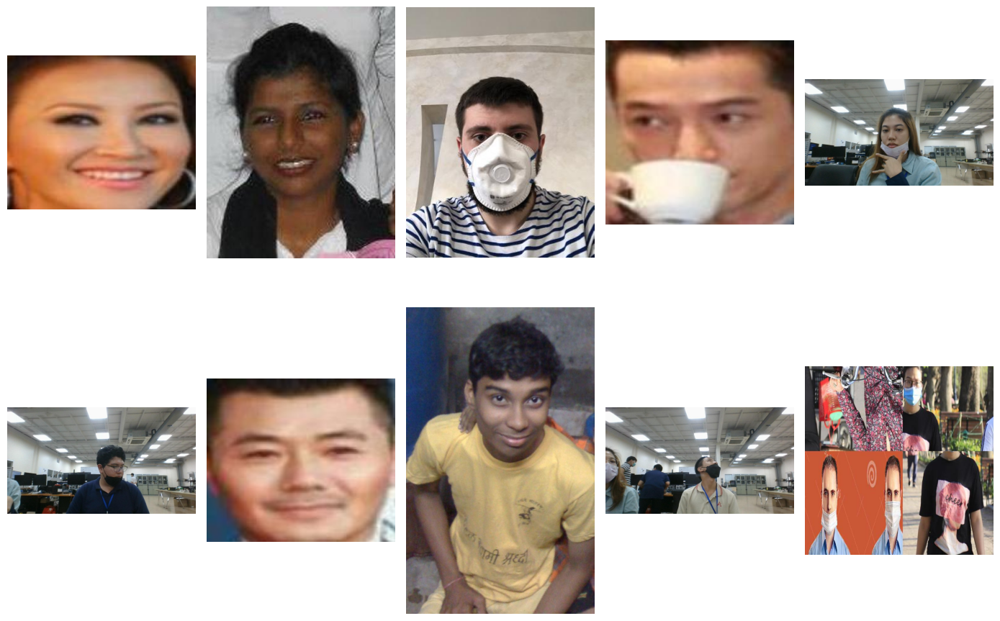

In [6]:
images_train_folder = Path('/kaggle/working/mask_detection_combined-1/train/images') # Object point
# to training images folder, we will use it to extract just images since the folder contains
# labels for each image

extract_just_images = list(images_train_folder.glob('*.jpg')) # A list contains extracted 
# images from 'images_train_folder',
# 1- 'glob()' function will check the extention of a file, '*' represent anything before 
# 'jpg' extention
# 2- 'list()' convert output of 'glob()' to a list 

random_images_selection = random.sample(extract_just_images, 10) # 'random.sample()' will 
# choose random 10 images from 'extract_just_images' list

plt.figure(figsize = (14,10)) # Create a new figure (width,high) -container of sub figures size-

# A loop throgh into random images 
for iteration, current_imgage_path in enumerate(random_images_selection,1):
    img = Image.open(current_imgage_path) # 1- it will open the path of image
    plt.subplot(2, 5, iteration) # create the sub figure (2 row, 5 column, on current iteration)
    plt.imshow(img) # Display sub figure
    plt.axis('off') # Don't show axis
    
    
plt.tight_layout() # A space between each sub
plt.show() # Display container with its sub figurs



## Figures Shows Statical Analysis

* **Number of Objects per Image**


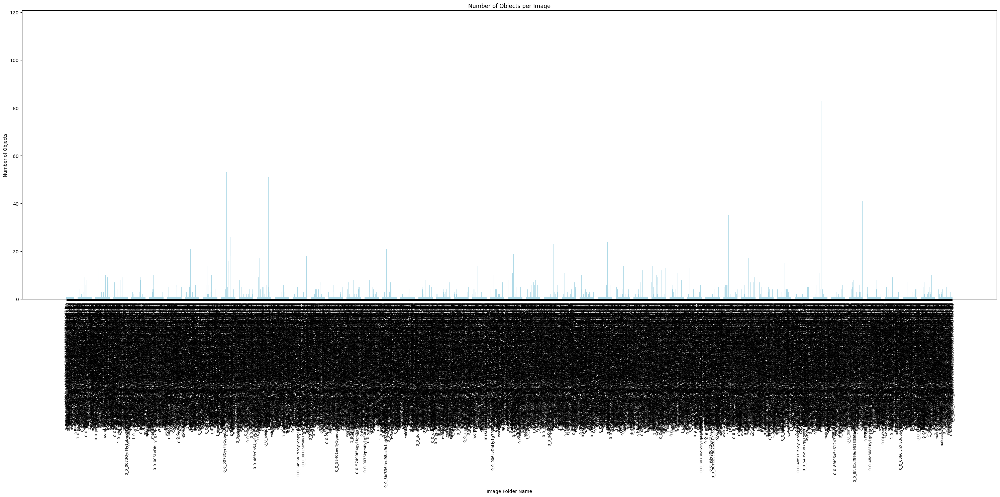

In [4]:
# Testing paths image, label
image_f = '/kaggle/working/mask_detection_combined-1/train/images'
label_f = '/kaggle/working/mask_detection_combined-1/train/labels'

# List contains all labels of testing
all_labels = [label_file for label_file in os.listdir(label_f) if label_file.endswith('.txt')]


# Lists will store name and count to use it later to create a figure
image_names = []
object_counts = []

#Loop throgh each file label
for label_file in all_labels:
    
    # Path of current label file
    label_path = os.path.join(label_f, label_file)
    
    # 1) Open label file
    # 2) read each line (to figure how many objects on the label file)
    with open(label_path, 'r') as f:
        lines = f.readlines()
    
    # Number of objects = number of lines on label file
    number_of_obj = len(lines)
    
    # Get image name by: replace extintion '.txt' with '.jpg'
    image_name = label_file.replace('.txt', '.jpg')
    
    # join 'image_f' with derived 'image_name' to find full path of image 
    image_path = os.path.join(image_f, image_name)
    # load image
    image = cv2.imread(image_path)
    
    # If the image can not load -> skip to next iteration
    if image is None:
        continue
    
    #Append to the defined list (number of objetcts) and (name of image)
    image_names.append(image_name)
    object_counts.append(number_of_obj)

# Settibg figure 
plt.figure(figsize=(30, 15)) # 
plt.bar(image_names, object_counts, color='lightblue') # (x-axis, y-axis, color )
plt.xticks(rotation=90, fontsize=8) # Rotate x-axis of 90 degree since image names larges
plt.xlabel('Image Folder Name') # x-axis name
plt.ylabel('Number of Objects') # y-axis name 
plt.title('Number of Objects per Image') # Figure title
plt.tight_layout() 
plt.show()

* **class distribution**


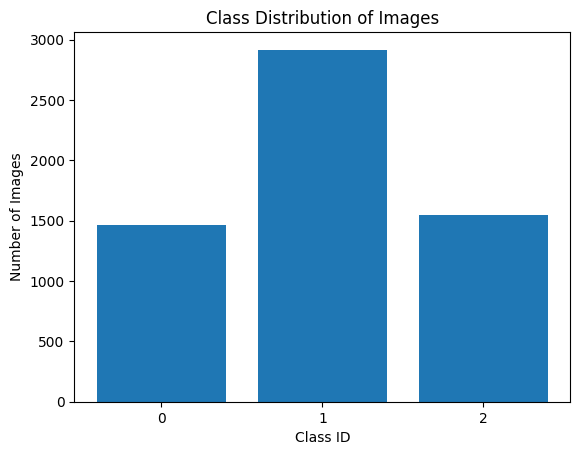

In [8]:
# Function to count class distribution from label files
def get_class_distribution(labels_dir):
    class_counts = Counter()
    
    # Iterate over each label file and extract class ids
    for label_file in os.listdir(labels_dir):
        label_path = os.path.join(labels_dir, label_file)
        if os.path.isfile(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
            
            # Count each class ID present in the file
            for line in lines:
                class_id = int(line.split()[0])
                class_counts[class_id] += 1
    
    return class_counts

# Get class distribution
labels_dir = '/kaggle/working/mask_detection_combined-1/train/labels'
class_distribution = get_class_distribution(labels_dir)

# Create a bar chart for class distribution
plt.bar(class_distribution.keys(), class_distribution.values())
plt.xlabel("Class ID")
plt.ylabel("Number of Images")
plt.title("Class Distribution of Images")
plt.xticks(list(class_distribution.keys()))
plt.show()


* **Visualize Height vs Width of Image**

The scatter plot reveals a positive correlation between the width and height of images in the dataset, indicating that most images maintain a consistent aspect ratio. The majority are clustered in the lower-left corner, suggesting they are relatively small, while a few outliers with significantly larger dimensions are present. Since YOLO will be used for object detection, there is no need to resize or preprocess the images, as YOLO can handle varying image sizes during processing.

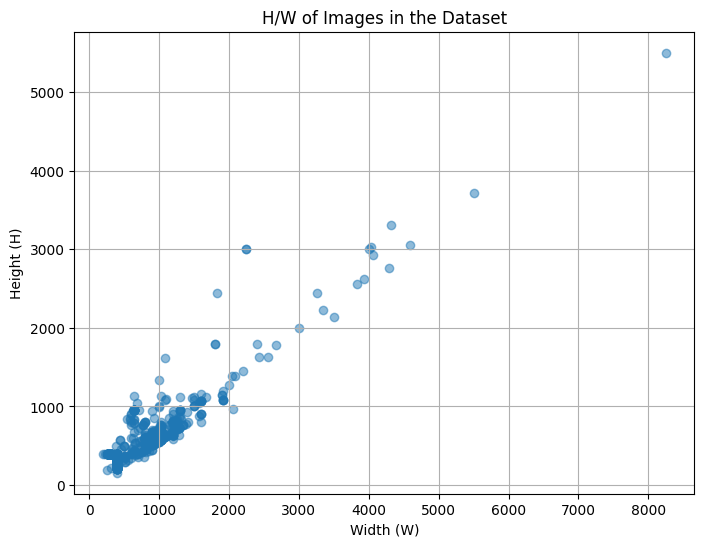

In [6]:
# Function to extract image dimensions
def get_image_dimensions(base_dir):
    image_dir = os.path.join(base_dir, "images")
    widths = []
    heights = []

    # Loop through each image file in the directory
    for file_name in os.listdir(image_dir):
        file_path = os.path.join(image_dir, file_name)

        try:
            with Image.open(file_path) as img:
                width, height = img.size
                widths.append(width)
                heights.append(height)
        except Exception as e:
            print(f"Could not open {file_name}: {e}")
    
    return widths, heights

# Replace with the actual path to your dataset
base_dir = "/kaggle/input/face-mask-dataset/train/train"

# Extract image dimensions
widths, heights = get_image_dimensions(base_dir)

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.xlabel("Width (W)")
plt.ylabel("Height (H)")
plt.title("H/W of Images in the Dataset")
plt.grid(True)
plt.show() 


* **Distribution of Object Area to Image Area Ratio**

This histogram shows the frequency of objects take up different amounts of space in images, ranging from very small to almost the whole image. The rsult figure shows most objects having a very small area ratio close to zero, and a significant spike at a ratio of 1.0, indicating that some objects occupy the entire image area.


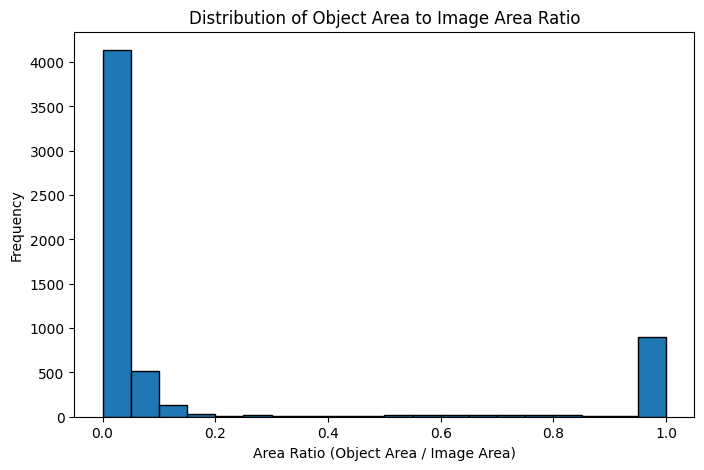

In [7]:
images_dir = '/kaggle/working/mask_detection_combined-1/train/images'
labels_dir = '/kaggle/working/mask_detection_combined-1/train/labels'

# List to store ratios of bounding box area to image area
ratios = []

# YOLOv8 label format: class_id x_center y_center width height 
def read_yolo_label(label_file):
    with open(label_file, 'r') as f:
        lines = f.readlines()
    return [list(map(float, line.strip().split())) for line in lines]

# Process label and image files
for label_file in os.listdir(labels_dir):
    label_path = os.path.join(labels_dir, label_file)
    label_data = read_yolo_label(label_path)

    # Get corresponding image dimensions
    image_name = label_file.replace('.txt', '.jpg')  
    image_path = os.path.join(images_dir, image_name)
    with Image.open(image_path) as img:
        img_width, img_height = img.size
        img_area = img_width * img_height  # Calculate image area in pixels

    # Calculate bounding box areas 
    for label in label_data:
        bbox_width_abs = label[3] * img_width
        bbox_height_abs = label[4] * img_height
        bbox_area = bbox_width_abs * bbox_height_abs  # Calculate bbox in pixels

        # Ratio of bbox area to image area
        area_ratio = bbox_area / img_area
        ratios.append(area_ratio)

# Plot the distribution of the ratios
plt.figure(figsize=(8, 5))
plt.hist(ratios, bins=20, edgecolor='black')
plt.title('Distribution of Object Area to Image Area Ratio')
plt.xlabel('Area Ratio (Object Area / Image Area)')
plt.ylabel('Frequency')
plt.show()

## Split Dataset
The dataset is split into training, validation, and test sets.
80% training, 10% validating and 10% testing with stratify

In [5]:
images_dir  = '/kaggle/working/mask_detection_combined-1/train/images'
labels_dir  = '/kaggle/working/mask_detection_combined-1/train/labels'
output_dir = '/kaggle/working/output'


# Create output dataset of train, val, and test
for split in ['train_before', 'val', 'test']:
    os.makedirs(os.path.join(output_dir, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, split, 'labels'), exist_ok=True)

# save list of images and labels
images = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])
labels = sorted([f for f in os.listdir(labels_dir) if f.endswith('.txt')])

# Ensure that each image has a corresponding label file
assert len(images) == len(labels)

# Extract class labels from label files
def extract_classes(label_file):
    with open(os.path.join(labels_dir, label_file), 'r') as f:
        lines = f.readlines()
    class_labels = [int(line.split()[0]) for line in lines] # The class is the first index in each line
    return class_labels

# Data for multi-label stratified split
class_labels_all = []  # List of all classes for each image
data_pairs = []  # (image_file, label_file)

# Loop through all image-label pairs to collect class labels
for image_file, label_file in zip(images, labels):
    #class_labels = extract_classes(label_file)
    class_labels_all.append(extract_classes(label_file))
    data_pairs.append((image_file, label_file))

unique_classes = sorted(set([cls for sublist in class_labels_all for cls in sublist])) # Classes of the objects from 0 to 7
class_matrix = np.zeros((len(class_labels_all), len(unique_classes)), dtype=int) # Matrix(number of images * number of classes)

# For each image, class that appears in the image set to 1
for i, labels in enumerate(class_labels_all):
    for label in labels:
        class_matrix[i, unique_classes.index(label)] = 1



# Split dataset into train (80%) and temp (20%)
msss = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_id, temp_id = next(msss.split(data_pairs, class_matrix))
train_pairs = [data_pairs[i] for i in train_id]
temp_pairs = [data_pairs[i] for i in temp_id]

temp_class_matrix = class_matrix[temp_id]

# Split temp into test (10%) and validation (10%)
msss = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
val_id, test_id = next(msss.split(temp_pairs, temp_class_matrix))
val_pairs = [temp_pairs[i] for i in val_id]
test_pairs = [temp_pairs[i] for i in test_id]

all_files = train_pairs + val_pairs + test_pairs
unique_files = set(all_files)
print(f"Total files: {len(all_files)}, Unique files: {len(unique_files)}")

# Function to copy files to the new directories
def copy_files(pairs, text):
    for image_file, label_file in pairs:
        shutil.copy(os.path.join(images_dir, image_file), os.path.join(output_dir, text, 'images', image_file))
        shutil.copy(os.path.join(labels_dir, label_file), os.path.join(output_dir, text, 'labels', label_file))

# Copy train, val, and test data
copy_files(train_pairs, 'train_before')
copy_files(val_pairs, 'val')
copy_files(test_pairs, 'test')

print("Dataset split completed with ratios of 80% train, 10% test, 10% val.")


Total files: 2699, Unique files: 2699
Dataset split completed with ratios of 80% train, 10% test, 10% val.


Distribution of split classes

In [6]:
def dist(labels_folder, text):
    class_counter = Counter()

    # Loop through each label file to count the object classes
    for label_file in os.listdir(labels_folder): 
          with open(os.path.join(labels_folder, label_file), 'r') as file:
              lines = file.readlines()
              for line in lines:
                  class_id = int(line.split()[0])  # Assuming class id is the first element in each line
                  class_counter[class_id] += 1

    # Compute the total count of all classes
    total_count = sum(class_counter.values())

    # Display the class distribution and as a ratio
    print(f"Class Distribution {text}:")
    for class_id, count in class_counter.items():
        ratio = count / total_count
        print(f"Class {class_id}: {count} (Ratio: {ratio:.4f})")

train_d = dist("/kaggle/working/output/train_before/labels", "train")
val_d = dist("/kaggle/working/output/val/labels", "val")
test_d = dist("/kaggle/working/output/test/labels", "test")


Class Distribution train:
Class 0: 1172 (Ratio: 0.2515)
Class 2: 1218 (Ratio: 0.2614)
Class 1: 2270 (Ratio: 0.4871)
Class Distribution val:
Class 2: 178 (Ratio: 0.2743)
Class 0: 141 (Ratio: 0.2173)
Class 1: 330 (Ratio: 0.5085)
Class Distribution test:
Class 1: 317 (Ratio: 0.5129)
Class 2: 149 (Ratio: 0.2411)
Class 0: 152 (Ratio: 0.2460)


# Distribution of train Classes (Before Downsampling)

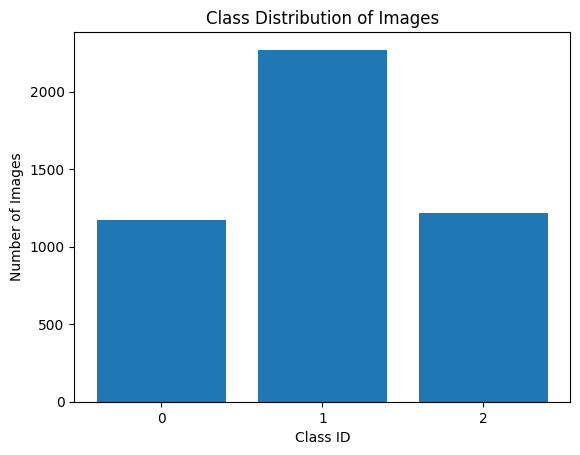

In [9]:
labels_dir = '/kaggle/working/output/train_before/labels'  
class_distribution = get_class_distribution(labels_dir)


# Create a bar chart for class distribution
plt.bar(class_distribution.keys(), class_distribution.values())
plt.xlabel("Class ID")
plt.ylabel("Number of Images")
plt.title("Class Distribution of Images")
plt.xticks(list(class_distribution.keys()))
plt.show()


## Downsampling (remove some images of class 1)

In [6]:
import os
import shutil
import random
from collections import Counter

# Define paths for labels and images
labels_dir = '/kaggle/working/output/train_before/labels'
images_dir = '/kaggle/working/output/train_before/images' 
filtered_labels_dir = '/kaggle/working/output/train/labels'
filtered_images_dir = '/kaggle/working/output/train/images'

# Remove existing directories for filtered labels and images if they exist, then recreate them
if os.path.exists(filtered_labels_dir):
    shutil.rmtree(filtered_labels_dir)
if os.path.exists(filtered_images_dir):
    shutil.rmtree(filtered_images_dir)

os.makedirs(filtered_labels_dir, exist_ok=True)
os.makedirs(filtered_images_dir, exist_ok=True)

# Function to get the distribution of class IDs from the label files
def get_full_class_distribution(labels_dir):
    class_counts = Counter()
    for label_file in os.listdir(labels_dir):
        label_path = os.path.join(labels_dir, label_file)
        with open(label_path, 'r') as f:
            lines = f.readlines()
        # Extract class IDs from each line of the label file
        class_ids = [int(line.split()[0]) for line in lines]
        class_counts.update(class_ids)
    return class_counts

# Function to filter and downsample files
def filter_and_downsample():
    class_1_files = []
    other_class_files = []
    
    # Classify files based on class ID
    for label_file in os.listdir(labels_dir):
        label_path = os.path.join(labels_dir, label_file)
        with open(label_path, 'r') as f:
            lines = f.readlines()        
        class_ids = [int(line.split()[0]) for line in lines]

        # Adjust logic to include only files that are exclusively of class "1"
        if 1 in class_ids and len(set(class_ids)) == 1:
            class_1_files.append(label_file)
        else:
            other_class_files.append(label_file)
    
    # Downsample: Reduce class "1" files to a lower percentage (10% in this case)
    downsample_ratio = 0.1
    class_1_files = random.sample(class_1_files, int(len(class_1_files) * downsample_ratio))
    
    # Combine the selected downsampled class "1" files with the other class files
    files_to_copy = class_1_files + other_class_files
    
    # Copy the selected files to the new directories
    for label_file in files_to_copy:
        # Copy label files
        src_label_path = os.path.join(labels_dir, label_file)
        dest_label_path = os.path.join(filtered_labels_dir, label_file)
        shutil.copy(src_label_path, dest_label_path)
        
        # Copy the corresponding image files
        image_file = label_file.replace('.txt', '.jpg')
        src_image_path = os.path.join(images_dir, image_file)
        dest_image_path = os.path.join(filtered_images_dir, image_file)
        
        if os.path.exists(src_image_path):
            shutil.copy(src_image_path, dest_image_path)

# Call the function to perform the downsampling and file copying
filter_and_downsample()

print("Successfully balancing the training labels")


Successfully balancing the training labels


# Distribution of Train Classes (After Downsampling)

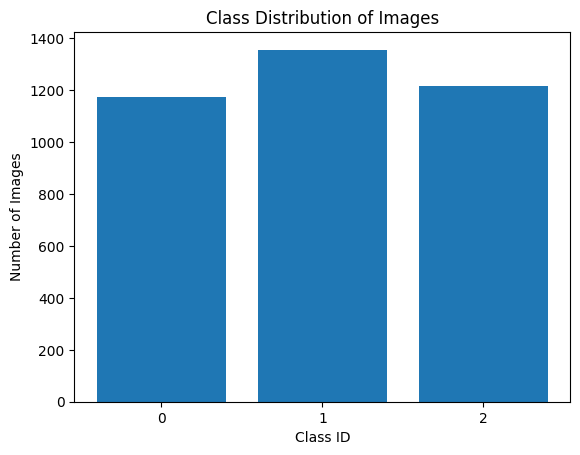

In [11]:
labels_dir = '/kaggle/working/output/train/labels'  
class_distribution = get_class_distribution(labels_dir)


# Create a bar chart for class distribution
plt.bar(class_distribution.keys(), class_distribution.values())
plt.xlabel("Class ID")
plt.ylabel("Number of Images")
plt.title("Class Distribution of Images")
plt.xticks(list(class_distribution.keys()))
plt.show()


# Recognition Before Training on YOLOv8 Pre-trained model:

The bounding box arround the person, it shows a label of person with precentage value, then it did not recognize the mask -> The model need to be trained on the dataset to can recognize and detect the mask

100%|██████████| 6.25M/6.25M [00:00<00:00, 71.5MB/s]



image 1/1 /kaggle/input/face-mask-dataset/train/train/images/0009S6815V3PEU1N-C123-F4.jpg: 480x640 10 persons, 1 handbag, 1 cup, 1 cell phone, 47.8ms
Speed: 12.1ms preprocess, 47.8ms inference, 266.6ms postprocess per image at shape (1, 3, 480, 640)


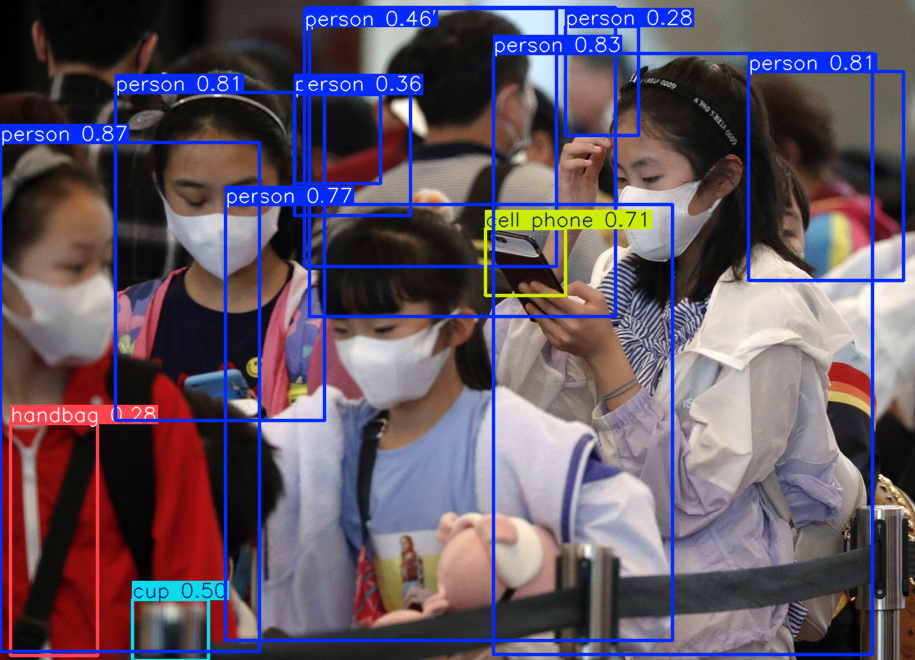

In [11]:

# Use a pretrained YOLOv8n model
model = YOLO("yolov8n.pt")

# Use the model to detect object
image = "/kaggle/input/face-mask-dataset/train/train/images/0009S6815V3PEU1N-C123-F4.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

# Create A Yaml File

Why we create it? Since yolo use it as a 

In [8]:
import yaml

data = {
    'train': '/kaggle/working/output/train/images',
    'val': '/kaggle/working/output/val/images',
    'test': '/kaggle/working/output/test/images',
    'nc': 3,  # number of classes
    'names': [ 'improper_mask', 'mask','no_mask']  # Classes names
}

# Save to data.yaml
with open('/kaggle/working/data.yaml', 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

print("data.yaml created")

data.yaml created


## Train YOLOv8n On Dataset

In [9]:

# Load the pretrained YOLOv8 model
model = YOLO("yolov8n.pt")

# Train the model without W&B integration
results = model.train(
    data='/kaggle/working/data.yaml', 
    epochs=100, 
    batch=16, 
    imgsz=640,
    dropout=0.2,
    mixup=0.5,
    save=True, 
    val=True
)



100%|██████████| 6.25M/6.25M [00:00<00:00, 72.4MB/s]


Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

100%|██████████| 755k/755k [00:00<00:00, 13.9MB/s]
2024-10-19 04:19:42,812	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-19 04:19:43,375	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 66.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/output/train/labels... 1790 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1790/1790 [00:01<00:00, 989.56it/s]


train: New cache created: /kaggle/working/output/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/output/val/labels... 280 images, 0 backgrounds, 0 corrupt: 100%|██████████| 280/280 [00:00<00:00, 849.96it/s]

val: New cache created: /kaggle/working/output/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.58G      1.374      2.217      1.512         62        640: 100%|██████████| 112/112 [00:25<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]

                   all        280        649      0.699      0.377      0.538      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.56G        1.2       1.58      1.378         63        640: 100%|██████████| 112/112 [00:23<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.32it/s]


                   all        280        649      0.584       0.46      0.481      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       2.4G      1.193      1.431      1.372         77        640: 100%|██████████| 112/112 [00:22<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.99it/s]


                   all        280        649      0.797      0.613      0.701      0.475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.33G      1.167      1.343      1.347         95        640: 100%|██████████| 112/112 [00:22<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.42it/s]

                   all        280        649      0.643       0.59      0.647      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.52G      1.108      1.243      1.318        130        640: 100%|██████████| 112/112 [00:22<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.59it/s]

                   all        280        649      0.684      0.623      0.666      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.57G      1.115      1.172      1.285        104        640: 100%|██████████| 112/112 [00:22<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.67it/s]

                   all        280        649      0.838      0.664      0.784       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.33G      1.072      1.118      1.293         84        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        280        649      0.785      0.722      0.778      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.52G      1.068      1.087      1.264         68        640: 100%|██████████| 112/112 [00:22<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.30it/s]

                   all        280        649      0.821      0.691      0.793      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.73G      1.016      1.025      1.251         97        640: 100%|██████████| 112/112 [00:22<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.57it/s]

                   all        280        649      0.831      0.702      0.793      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.53G      1.006      1.015      1.243         72        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.77it/s]

                   all        280        649      0.779      0.739      0.797      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.59G      1.002     0.9721      1.219         70        640: 100%|██████████| 112/112 [00:22<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]

                   all        280        649      0.826      0.685        0.8      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       2.4G     0.9714     0.9388      1.202         66        640: 100%|██████████| 112/112 [00:22<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.20it/s]

                   all        280        649       0.87      0.745      0.842      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       2.5G      1.007      0.962      1.214         60        640: 100%|██████████| 112/112 [00:22<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.58it/s]

                   all        280        649      0.851      0.748      0.838      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.47G     0.9609     0.9103      1.198        114        640: 100%|██████████| 112/112 [00:22<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.69it/s]

                   all        280        649      0.829      0.768      0.831      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.33G     0.9504     0.8891      1.192         94        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.63it/s]

                   all        280        649      0.842      0.794      0.843      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       2.5G     0.9529     0.9068      1.193         69        640: 100%|██████████| 112/112 [00:22<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.49it/s]

                   all        280        649      0.861       0.74      0.827      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.52G     0.9429     0.8723      1.175         49        640: 100%|██████████| 112/112 [00:22<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        280        649      0.824      0.746      0.826      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.51G     0.9275     0.8619      1.187        134        640: 100%|██████████| 112/112 [00:22<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.76it/s]

                   all        280        649       0.85      0.746      0.838      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.58G     0.9315     0.8441      1.172         64        640: 100%|██████████| 112/112 [00:22<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.57it/s]

                   all        280        649      0.873      0.765      0.866      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.57G     0.8924     0.8289      1.162         99        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.63it/s]

                   all        280        649      0.851      0.777      0.835      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.52G     0.9129     0.8306       1.17         94        640: 100%|██████████| 112/112 [00:22<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.39it/s]

                   all        280        649       0.88      0.766      0.851      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.53G     0.8984     0.8083       1.15         56        640: 100%|██████████| 112/112 [00:22<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        280        649      0.845       0.76      0.843      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.39G     0.8904     0.8013      1.151         96        640: 100%|██████████| 112/112 [00:23<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.67it/s]

                   all        280        649      0.895       0.78      0.862      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.84G       0.89     0.7879      1.154         78        640: 100%|██████████| 112/112 [00:23<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.73it/s]

                   all        280        649      0.872      0.801      0.867      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.33G     0.8714     0.7786      1.136         67        640: 100%|██████████| 112/112 [00:22<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.62it/s]

                   all        280        649      0.865      0.797      0.865       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.33G     0.8691     0.7799      1.151         63        640: 100%|██████████| 112/112 [00:22<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.61it/s]

                   all        280        649      0.876      0.787      0.855      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.49G     0.8577     0.7605      1.133         58        640: 100%|██████████| 112/112 [00:23<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.68it/s]

                   all        280        649      0.875      0.793       0.87      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.33G     0.8486     0.7434      1.134         77        640: 100%|██████████| 112/112 [00:23<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        280        649      0.846       0.76      0.856      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.33G     0.8564     0.7495      1.133         71        640: 100%|██████████| 112/112 [00:23<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.65it/s]

                   all        280        649      0.857      0.805      0.837      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.33G     0.8567     0.7398      1.131        138        640: 100%|██████████| 112/112 [00:22<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.12it/s]

                   all        280        649       0.88      0.811      0.865      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.52G     0.8381     0.7269      1.126         84        640: 100%|██████████| 112/112 [00:22<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.36it/s]

                   all        280        649      0.867      0.774      0.856      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.33G     0.8247      0.727      1.128         82        640: 100%|██████████| 112/112 [00:23<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]

                   all        280        649      0.857      0.829      0.869      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.52G     0.8408     0.7418       1.13        109        640: 100%|██████████| 112/112 [00:23<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.25it/s]

                   all        280        649      0.867      0.786      0.863      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.52G     0.8469     0.7308      1.127         64        640: 100%|██████████| 112/112 [00:23<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.43it/s]

                   all        280        649      0.869      0.808      0.871      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.38G     0.8056     0.6941      1.113         60        640: 100%|██████████| 112/112 [00:22<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.32it/s]

                   all        280        649      0.863       0.82      0.879      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.48G      0.844     0.7056      1.127         93        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.65it/s]

                   all        280        649       0.84      0.818      0.863      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.54G     0.8322     0.7106      1.113        111        640: 100%|██████████| 112/112 [00:22<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.45it/s]

                   all        280        649      0.876      0.815       0.87      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.52G     0.8171     0.7098      1.115         87        640: 100%|██████████| 112/112 [00:22<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.66it/s]

                   all        280        649       0.88      0.818      0.883      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.52G     0.8408     0.6983      1.106         52        640: 100%|██████████| 112/112 [00:22<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.49it/s]

                   all        280        649      0.905      0.801      0.876      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.49G     0.8199     0.6891       1.11         59        640: 100%|██████████| 112/112 [00:22<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        280        649      0.867      0.831      0.875      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.52G     0.8294     0.6983      1.106         78        640: 100%|██████████| 112/112 [00:22<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        280        649      0.884      0.814      0.879      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.52G     0.8046     0.6787      1.108         62        640: 100%|██████████| 112/112 [00:23<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.69it/s]

                   all        280        649      0.866      0.801      0.871      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.58G     0.8254     0.6802      1.105         86        640: 100%|██████████| 112/112 [00:23<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.38it/s]

                   all        280        649      0.902      0.803      0.878      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.54G     0.8008     0.6496      1.087         81        640: 100%|██████████| 112/112 [00:22<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.28it/s]

                   all        280        649      0.841      0.837      0.879      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.51G     0.7989     0.6571      1.094        103        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.44it/s]

                   all        280        649      0.884      0.823      0.871      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       2.4G     0.7895     0.6577      1.091         83        640: 100%|██████████| 112/112 [00:23<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.70it/s]

                   all        280        649      0.877      0.828      0.871      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.33G     0.7854     0.6445      1.091        124        640: 100%|██████████| 112/112 [00:22<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.63it/s]

                   all        280        649      0.878      0.815      0.855      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.54G     0.8031     0.6587       1.09        107        640: 100%|██████████| 112/112 [00:23<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.49it/s]

                   all        280        649      0.893      0.831      0.887      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.59G     0.8106     0.6617      1.096         62        640: 100%|██████████| 112/112 [00:22<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.55it/s]

                   all        280        649      0.892      0.823      0.868      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.33G     0.8035     0.6506      1.095         52        640: 100%|██████████| 112/112 [00:23<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.55it/s]

                   all        280        649      0.878      0.838      0.877      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.38G     0.7995     0.6523      1.086         62        640: 100%|██████████| 112/112 [00:23<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.43it/s]

                   all        280        649      0.887      0.829      0.887      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.52G     0.7809     0.6308      1.075         70        640: 100%|██████████| 112/112 [00:23<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.39it/s]

                   all        280        649      0.879      0.838      0.896      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.55G     0.7663     0.6368      1.076         66        640: 100%|██████████| 112/112 [00:23<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]

                   all        280        649      0.899      0.813      0.885      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.74G     0.7833     0.6345      1.085         62        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.41it/s]

                   all        280        649      0.899      0.821      0.871       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.54G     0.7622     0.6205      1.082         77        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.42it/s]

                   all        280        649      0.864      0.837      0.893      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.33G     0.7682     0.6395       1.08         84        640: 100%|██████████| 112/112 [00:22<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.43it/s]

                   all        280        649      0.896      0.818      0.881      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.46G     0.7423     0.6049      1.071         72        640: 100%|██████████| 112/112 [00:23<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.46it/s]

                   all        280        649      0.886      0.828       0.88      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.49G     0.7402     0.6254       1.07         53        640: 100%|██████████| 112/112 [00:22<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.96it/s]

                   all        280        649      0.915      0.823      0.897       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.33G     0.7387     0.6045      1.064         93        640: 100%|██████████| 112/112 [00:22<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.67it/s]

                   all        280        649      0.878      0.843      0.887      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.51G     0.7579     0.6002      1.065         71        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        280        649      0.901      0.819      0.894      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.52G     0.7653     0.6058      1.064         91        640: 100%|██████████| 112/112 [00:22<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.72it/s]

                   all        280        649      0.892      0.829      0.875      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.38G     0.7472     0.5922      1.065         69        640: 100%|██████████| 112/112 [00:23<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.58it/s]

                   all        280        649      0.914      0.808      0.891      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.58G     0.7592     0.6063      1.073         87        640: 100%|██████████| 112/112 [00:22<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        280        649      0.899      0.829      0.892      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.51G     0.7485     0.5982      1.063         85        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.47it/s]

                   all        280        649      0.918      0.803      0.889      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.38G     0.7438     0.5972      1.068         85        640: 100%|██████████| 112/112 [00:23<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.71it/s]

                   all        280        649       0.91      0.821      0.891      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.38G     0.7273     0.5843      1.059         62        640: 100%|██████████| 112/112 [00:23<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.43it/s]

                   all        280        649      0.909      0.815      0.886      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.49G     0.7511     0.5842      1.061        103        640: 100%|██████████| 112/112 [00:22<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.65it/s]

                   all        280        649      0.909       0.82      0.889      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       2.6G     0.7302     0.5795      1.056         88        640: 100%|██████████| 112/112 [00:22<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.47it/s]

                   all        280        649      0.894      0.834      0.892      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.54G     0.7293     0.5757       1.06        191        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.44it/s]

                   all        280        649      0.936      0.818      0.894      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.47G     0.7372      0.584      1.062         60        640: 100%|██████████| 112/112 [00:23<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.58it/s]

                   all        280        649      0.898      0.834      0.889       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.53G     0.7317     0.5772      1.061         67        640: 100%|██████████| 112/112 [00:23<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]

                   all        280        649      0.894      0.833      0.888      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.54G     0.7303     0.5772      1.048        124        640: 100%|██████████| 112/112 [00:23<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.10it/s]


                   all        280        649      0.904      0.835      0.889      0.685

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.33G     0.7221     0.5605      1.045         63        640: 100%|██████████| 112/112 [00:22<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.55it/s]

                   all        280        649      0.895      0.826      0.886      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.56G     0.7329     0.5713      1.049         69        640: 100%|██████████| 112/112 [00:23<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.45it/s]

                   all        280        649      0.904      0.829      0.891      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.51G     0.7415     0.5759      1.051         85        640: 100%|██████████| 112/112 [00:23<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.39it/s]

                   all        280        649      0.898      0.831      0.875      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.38G     0.7278     0.5582      1.041         82        640: 100%|██████████| 112/112 [00:23<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.48it/s]

                   all        280        649      0.893      0.841      0.887      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.49G     0.7112      0.552      1.049         73        640: 100%|██████████| 112/112 [00:22<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        280        649      0.903       0.83      0.882      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.52G     0.7162     0.5574      1.044         88        640: 100%|██████████| 112/112 [00:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.60it/s]

                   all        280        649      0.901       0.83      0.887      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.33G     0.6944     0.5473      1.041        121        640: 100%|██████████| 112/112 [00:22<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.68it/s]

                   all        280        649      0.882      0.856       0.89      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.48G     0.7131     0.5573      1.047         49        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.49it/s]

                   all        280        649      0.905      0.831      0.884      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.53G     0.7072     0.5549      1.051         61        640: 100%|██████████| 112/112 [00:23<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.44it/s]

                   all        280        649      0.903      0.843      0.893      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.41G     0.7065     0.5421       1.04         47        640: 100%|██████████| 112/112 [00:22<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.47it/s]

                   all        280        649      0.912       0.83      0.891      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.54G     0.7176     0.5526      1.049         95        640: 100%|██████████| 112/112 [00:23<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        280        649      0.926      0.818       0.89      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.57G     0.6986     0.5427      1.039         67        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.57it/s]

                   all        280        649      0.897      0.843      0.893      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.51G     0.6796     0.5338      1.029        133        640: 100%|██████████| 112/112 [00:23<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.52it/s]

                   all        280        649      0.905       0.83      0.891      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.48G     0.6847     0.5199       1.03        105        640: 100%|██████████| 112/112 [00:22<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.94it/s]

                   all        280        649      0.909      0.829      0.897      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.38G     0.7089     0.5338      1.039         80        640: 100%|██████████| 112/112 [00:22<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.66it/s]

                   all        280        649      0.905      0.833      0.895      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.51G     0.6968     0.5285      1.036         79        640: 100%|██████████| 112/112 [00:23<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.61it/s]

                   all        280        649      0.909       0.83       0.89      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.53G     0.6786     0.5152      1.019         69        640: 100%|██████████| 112/112 [00:23<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        280        649      0.914      0.832      0.887      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.33G     0.6901     0.5285      1.032         62        640: 100%|██████████| 112/112 [00:23<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.40it/s]

                   all        280        649      0.905      0.829        0.9      0.697


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.51G     0.6476     0.4263          1         24        640: 100%|██████████| 112/112 [00:22<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.54it/s]

                   all        280        649      0.889      0.839      0.884      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.51G     0.6369     0.3823     0.9865         38        640: 100%|██████████| 112/112 [00:21<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.70it/s]

                   all        280        649        0.9      0.838      0.888      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.51G     0.6223     0.3709     0.9812         38        640: 100%|██████████| 112/112 [00:21<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.67it/s]

                   all        280        649      0.895      0.837      0.892      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.51G     0.6171     0.3628      0.978         31        640: 100%|██████████| 112/112 [00:20<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.71it/s]

                   all        280        649      0.904      0.826      0.893      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.33G     0.6091     0.3554     0.9709         34        640: 100%|██████████| 112/112 [00:20<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.67it/s]

                   all        280        649      0.895      0.842       0.89      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.51G     0.6076     0.3517     0.9692         61        640: 100%|██████████| 112/112 [00:20<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.79it/s]

                   all        280        649      0.896      0.844      0.893       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.51G     0.5986     0.3509     0.9698         31        640: 100%|██████████| 112/112 [00:20<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.81it/s]

                   all        280        649      0.905      0.838      0.893      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.33G     0.6018     0.3532     0.9741         29        640: 100%|██████████| 112/112 [00:20<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.98it/s]

                   all        280        649        0.9      0.841      0.891      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.51G     0.5897     0.3415     0.9673         25        640: 100%|██████████| 112/112 [00:20<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.64it/s]

                   all        280        649      0.899      0.836       0.89      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.51G     0.5965     0.3389     0.9698         25        640: 100%|██████████| 112/112 [00:20<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  5.77it/s]

                   all        280        649      0.914      0.823      0.889      0.688



100 epochs completed in 0.703 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]


                   all        280        649      0.905       0.83        0.9      0.697
         improper_mask        105        141      0.897      0.936      0.965      0.807
                  mask         86        330      0.926      0.719       0.83       0.54
               no_mask        122        178      0.892      0.834      0.905      0.745
Speed: 0.1ms preprocess, 1.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▆████▇▇▇▇▇▇▇▇▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▁▁▁▁
lr/pg1,▆████▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▁▁▁
lr/pg2,████▇▇▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁
metrics/mAP50(B),▂▁▄▄▆▆▆▇▇▇▇▇▇▇████▇█████████████████████
metrics/mAP50-95(B),▁▁▃▄▄▅▅▅▅▅▆▆▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇███▇███
metrics/precision(B),▃▁▅▂▃▆▇▆▇▇▇▇▇▆▇█▆▇▇██▇█████████████▇████
metrics/recall(B),▁▂▅▆▆▇▆▆▇▇█▇▇▇▇██▇██▇███▇▇██████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▆▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▃▃▂▂▂▂▂▂▁


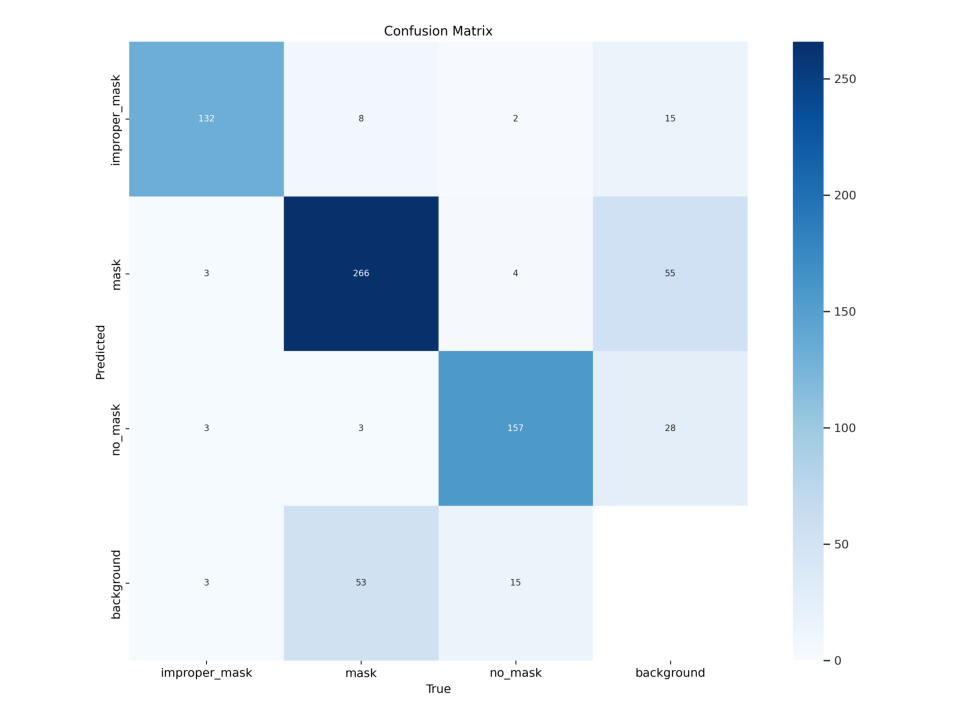

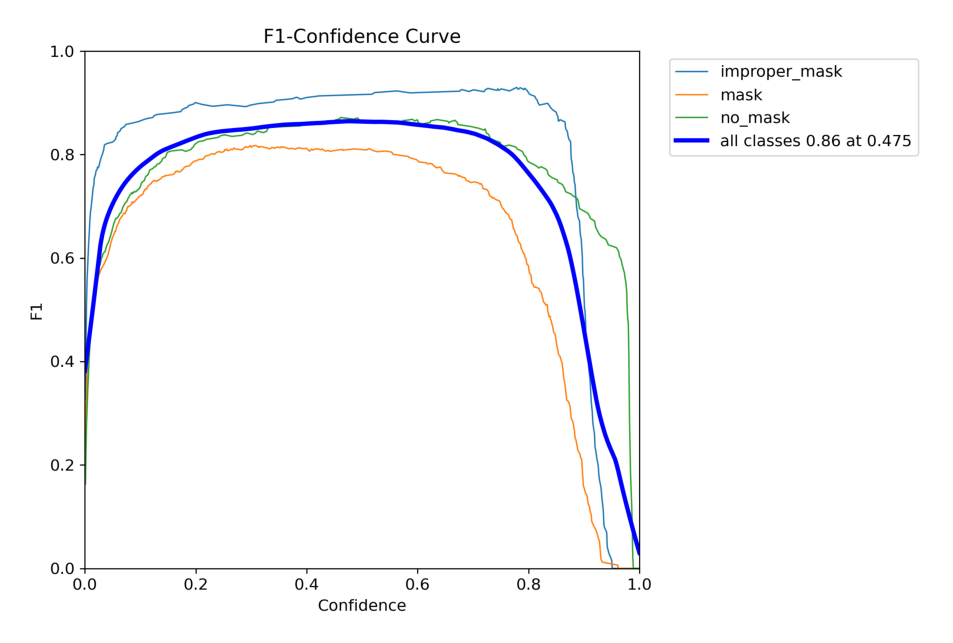

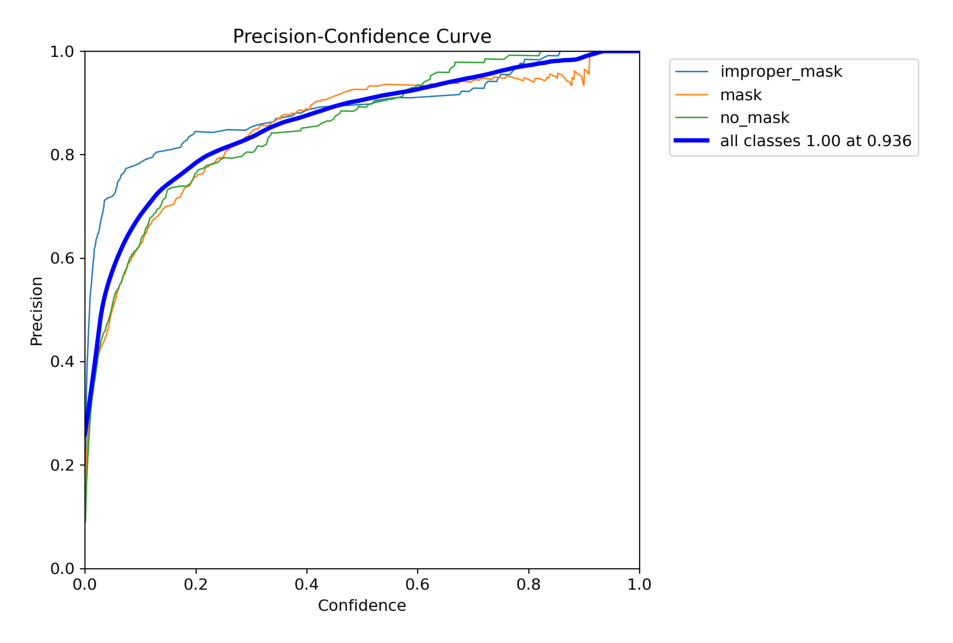

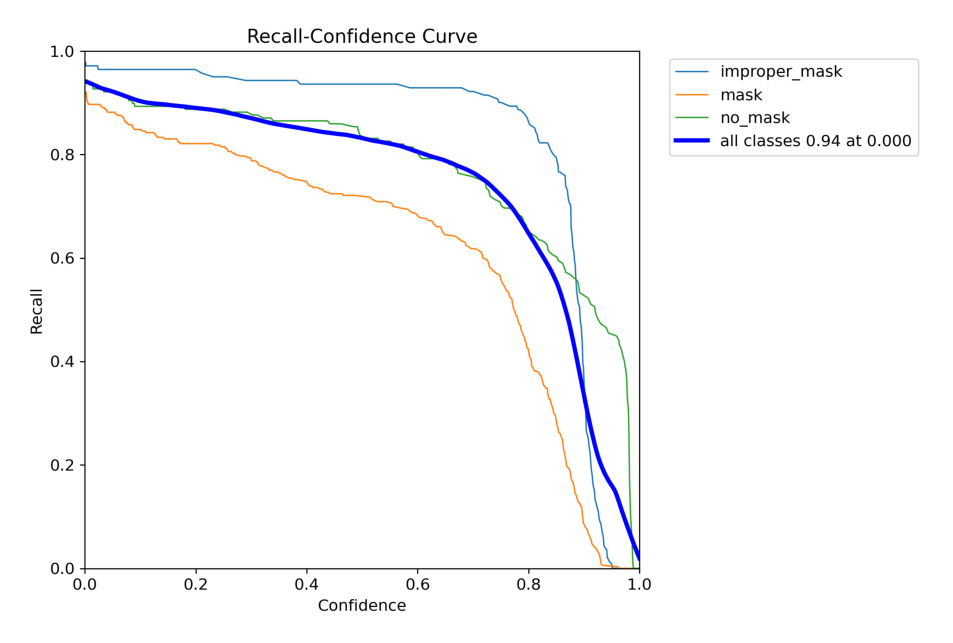

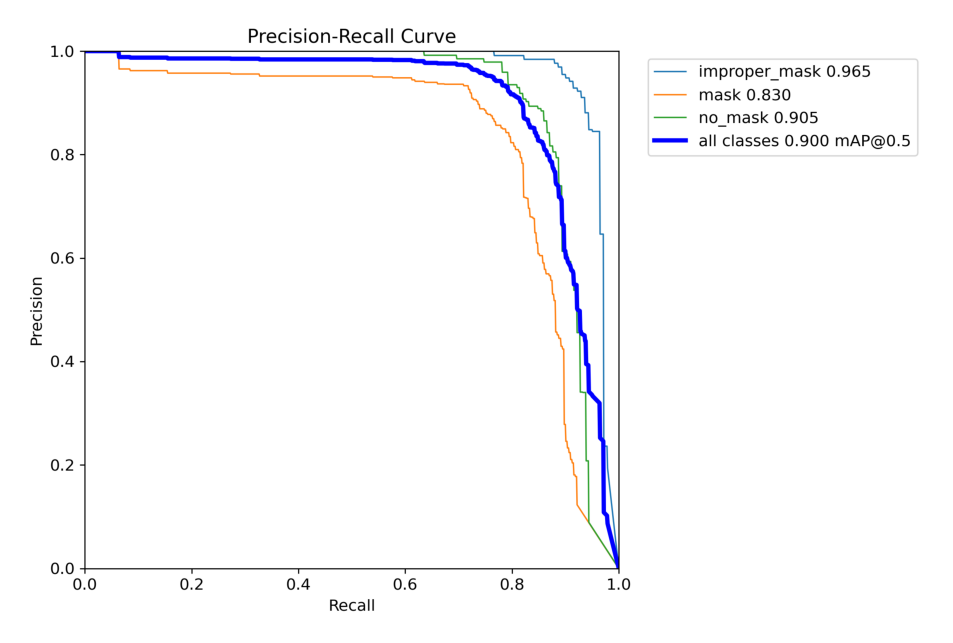

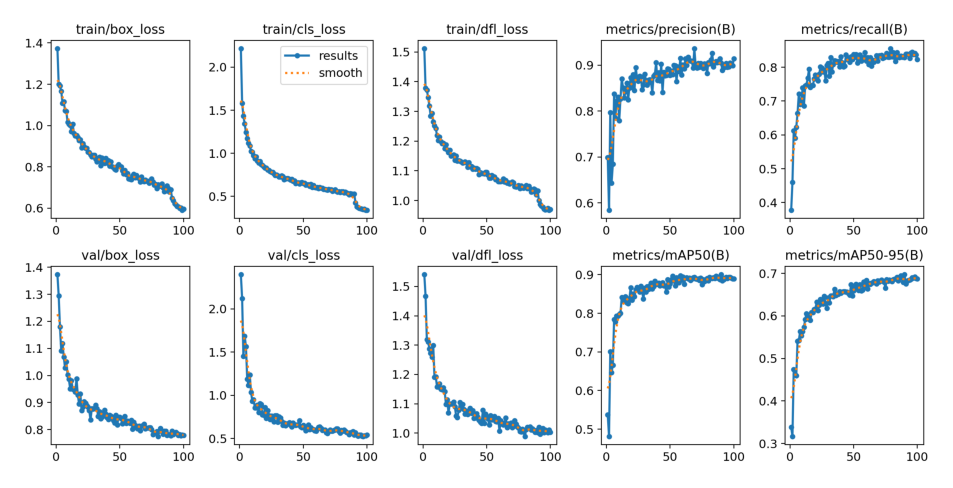

In [10]:
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/kaggle/working/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

# **Validate Dataset**

In [11]:
#https://docs.ultralytics.com/modes/val/#can-i-validate-my-yolov8-model-using-a-custom-dataset
# Validate the model
# Load a model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val(data="/kaggle/working/data.yaml")  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/output/val/labels.cache... 280 images, 0 backgrounds, 0 corrupt: 100%|██████████| 280/280 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.33it/s]


                   all        280        649      0.907       0.83      0.899      0.698
         improper_mask        105        141      0.898      0.936      0.966      0.805
                  mask         86        330      0.929      0.717       0.83      0.542
               no_mask        122        178      0.893      0.837      0.901      0.746
Speed: 0.1ms preprocess, 4.2ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val


array([    0.80499,     0.54193,     0.74626])

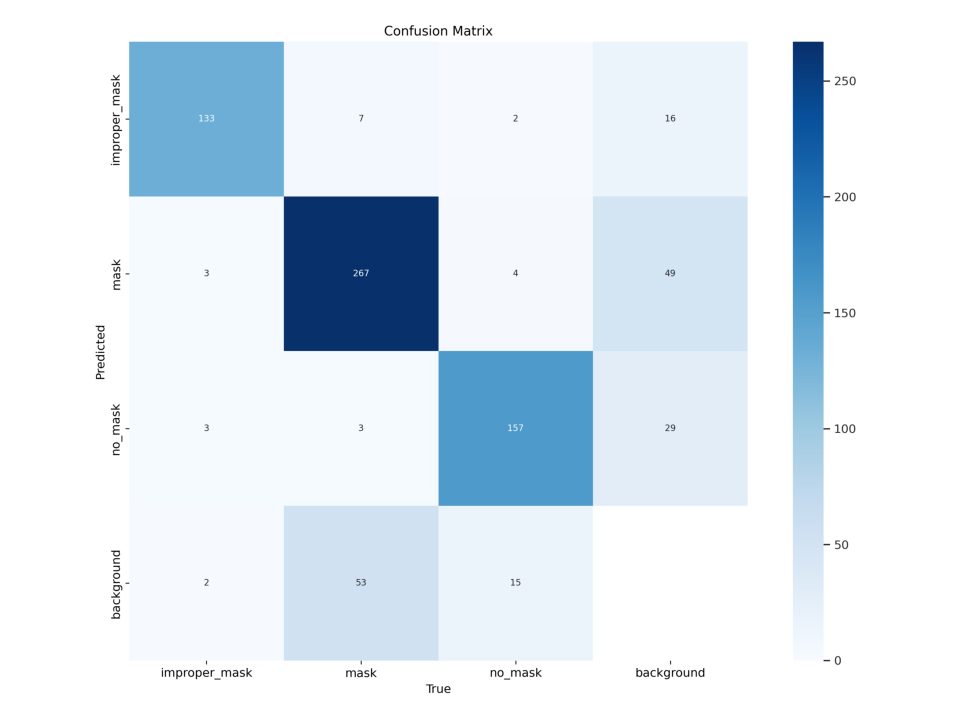

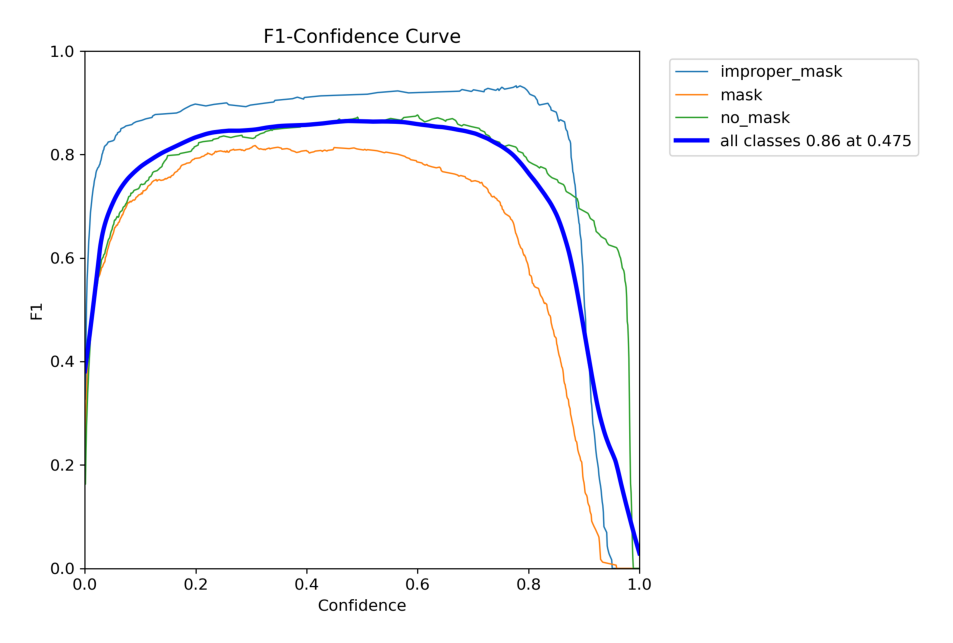

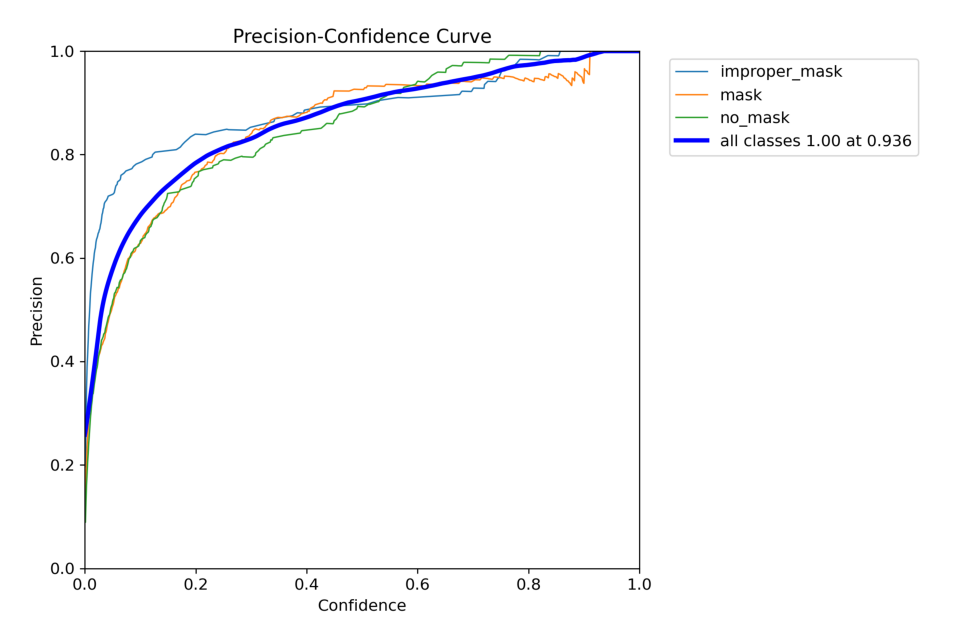

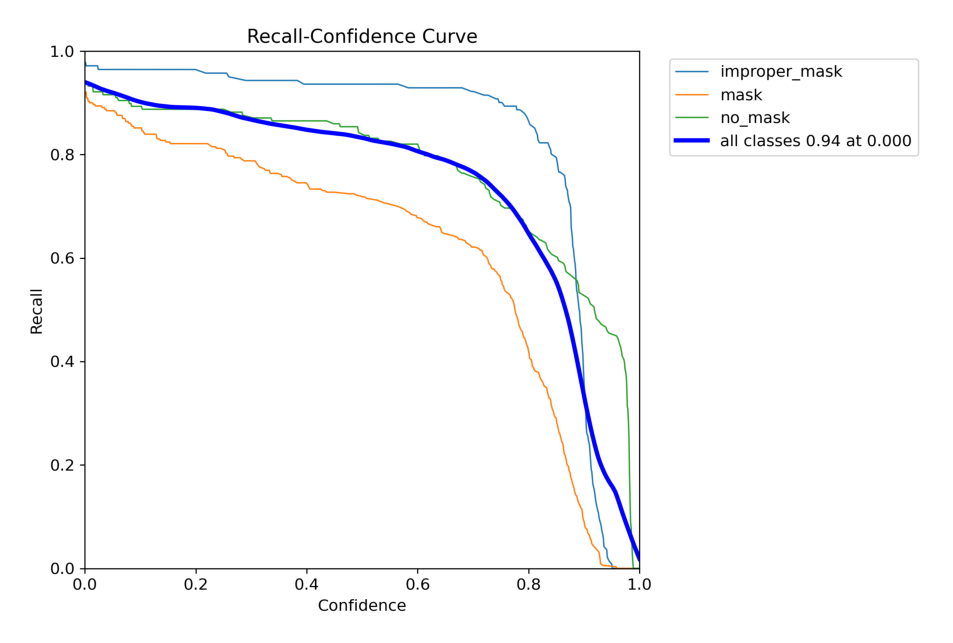

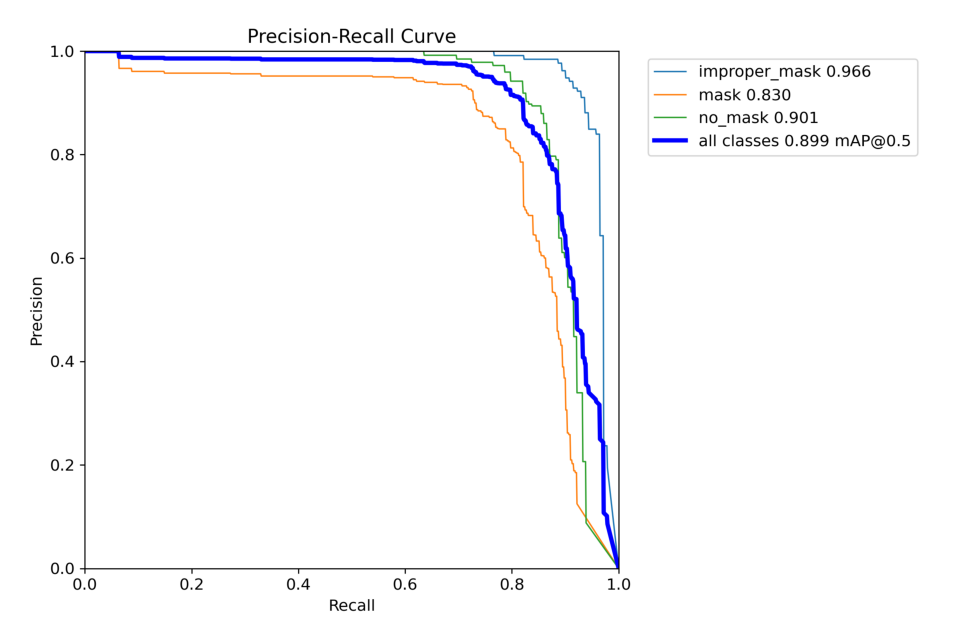

In [12]:
# List of image files to display
image_files = [
    'confusion_matrix.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png'
]

# Path to the directory containing the images
post_training_files_path = '/kaggle/working/runs/detect/val'

# Display the images
display_images(post_training_files_path, image_files)

# **Test Dataset**
Test dataset on the trained model

In [15]:
# Load a model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")  # load a custom model
# Evaluate the model on the test set
results = model.val(data='/kaggle/working/data.yaml', split='test')

# Extract key metrics
map50 = results.box.map50  # mAP@0.5
map50_95 = results.box.map  # mAP@0.5:0.95
precision = results.box.p
recall = results.box.r

print(f"Test set metrics:")
print(f"mAP@0.5: {map50:.4f}")
print(f"mAP@0.5:0.95: {map50_95:.4f}")
#print(f"IoU: {iou:.4f}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")



Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/output/test/labels... 267 images, 0 backgrounds, 0 corrupt: 100%|██████████| 267/267 [00:00<00:00, 963.33it/s]

val: New cache created: /kaggle/working/output/test/labels.cache



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:02<00:00,  5.95it/s]


                   all        267        618      0.903      0.868      0.931       0.73
         improper_mask        106        152      0.879      0.934      0.957      0.789
                  mask         86        317      0.909      0.792      0.888      0.607
               no_mask        123        149      0.921      0.879      0.946      0.794
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val2
Test set metrics:
mAP@0.5: 0.9308
mAP@0.5:0.95: 0.7298
Precision: [      0.879     0.90942     0.92081]
Recall: [    0.93421     0.79177     0.87919]


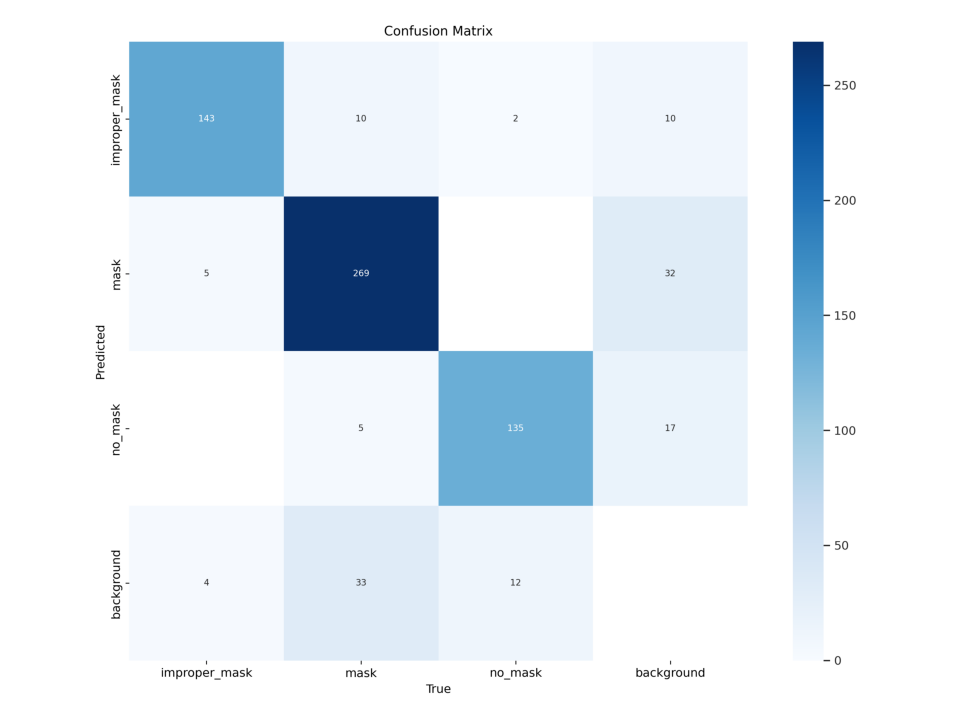

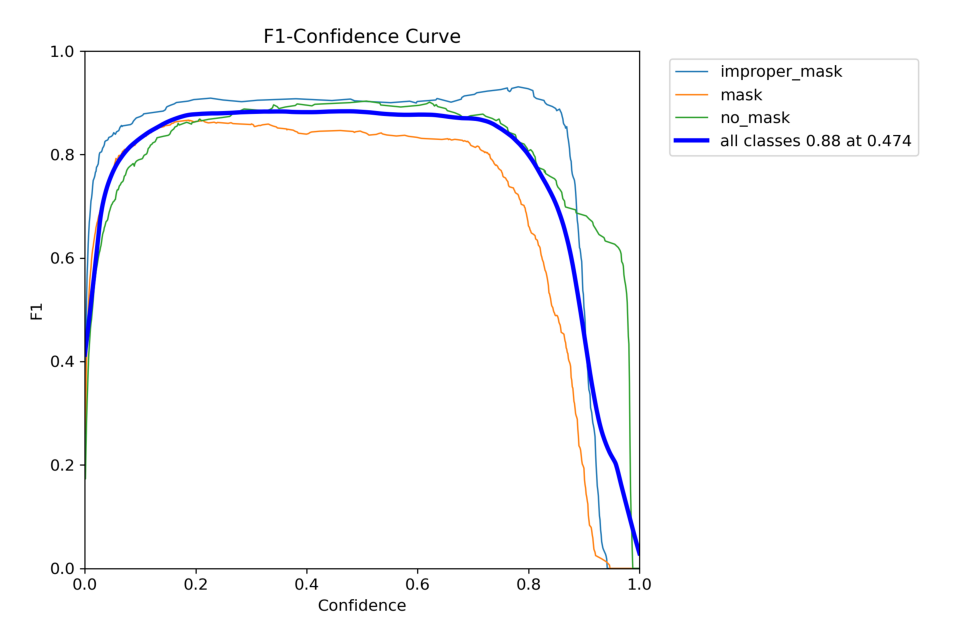

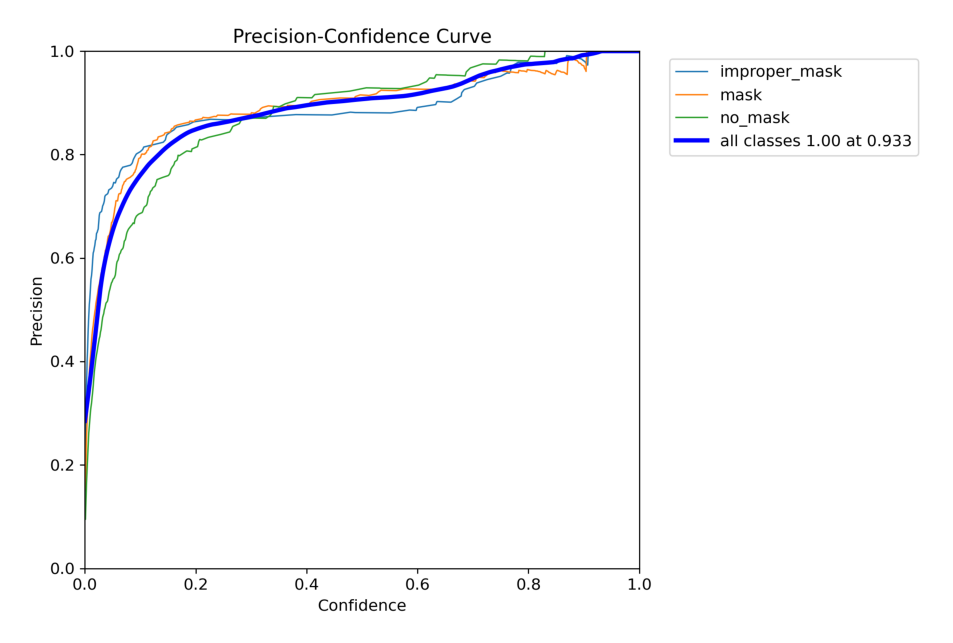

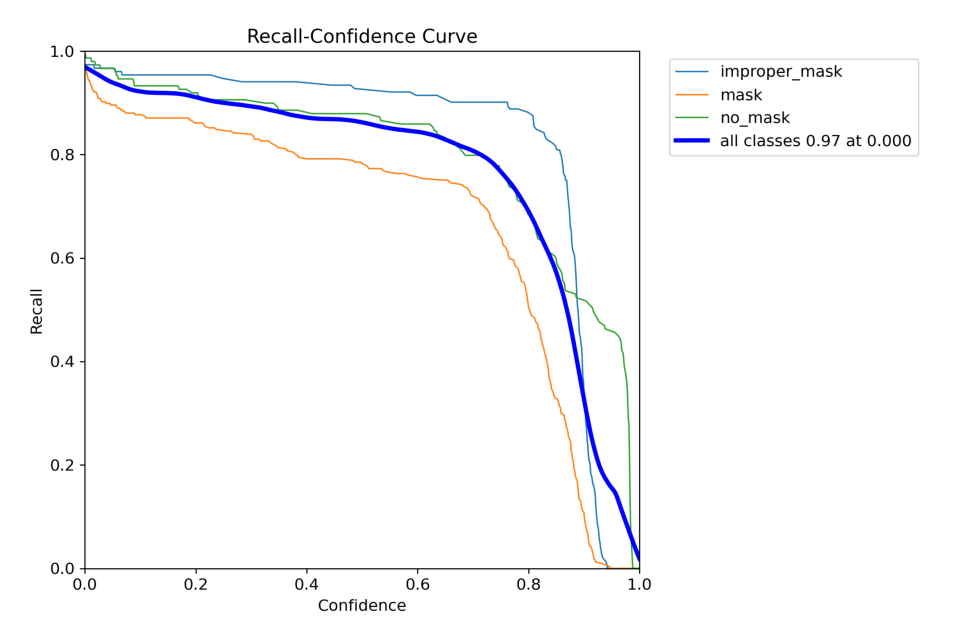

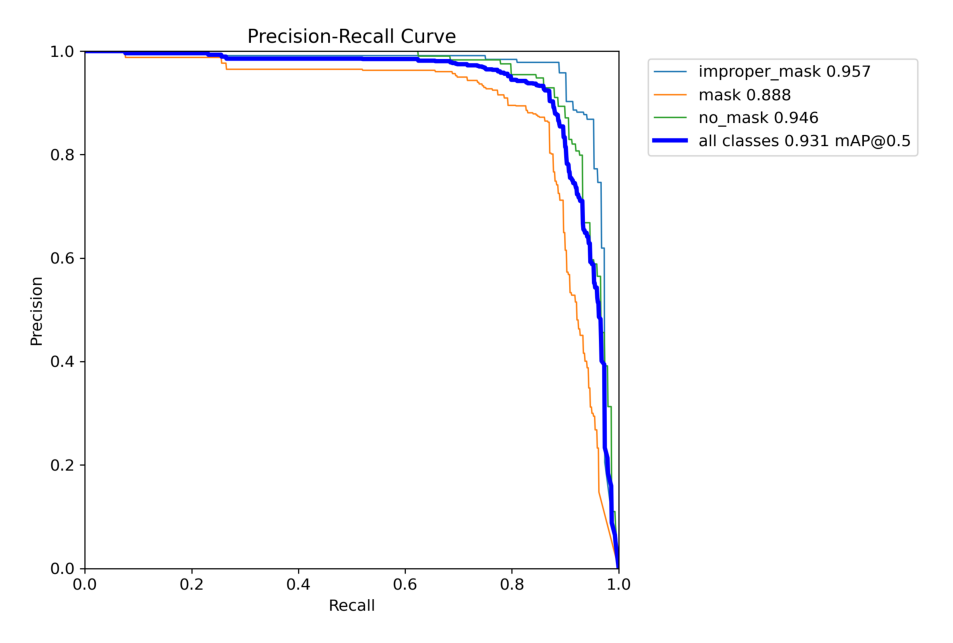

In [16]:
# List of image files to display
image_files = [
    'confusion_matrix.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png'
]

# Path to the directory containing the images
post_training_files_path = '/kaggle/working/runs/detect/val2'

# Display the images
display_images(post_training_files_path, image_files)

example images from the test set with the detected bounding boxes and class labels overlaid, comparing predictions with ground truth.

/kaggle/working/output/test/images/101_jpg.rf.41efb7fcc995fb7f8818216632bce978.jpg

0: 640x480 1 no_mask, 42.0ms
Speed: 2.0ms preprocess, 42.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)


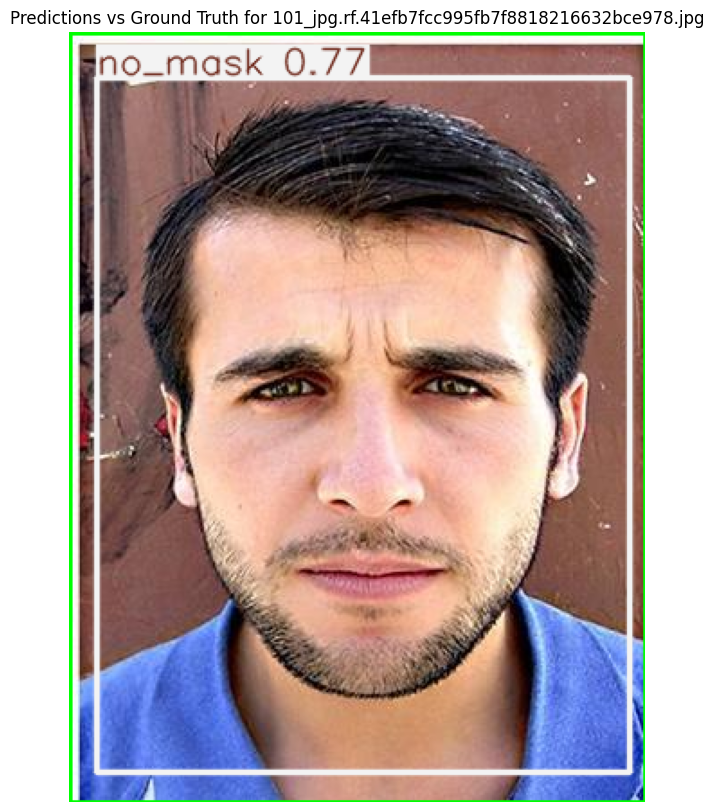

/kaggle/working/output/test/images/worng_mask787_jpg.rf.1e91d237bfa2015a8b030cdc346e4155.jpg

0: 384x640 1 improper_mask, 43.4ms
Speed: 1.8ms preprocess, 43.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


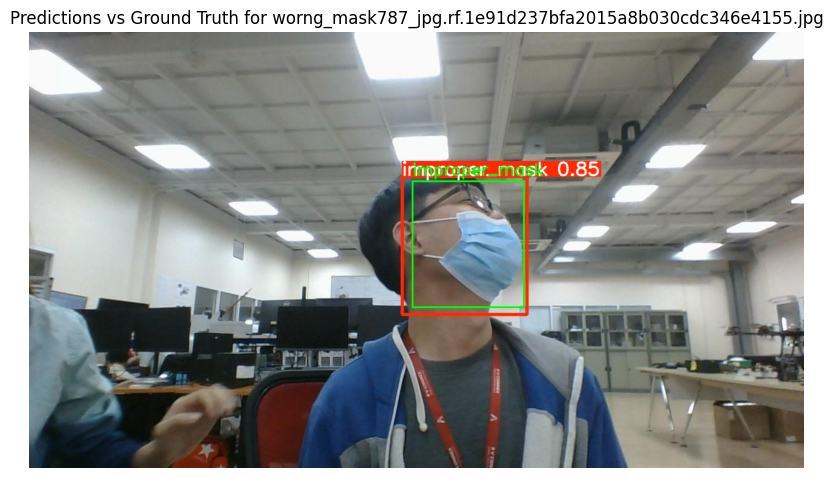

/kaggle/working/output/test/images/maksssksksss257_png.rf.68283e8ad474f583345161fb2a5199ef.jpg

0: 448x640 7 masks, 1 no_mask, 40.9ms
Speed: 2.1ms preprocess, 40.9ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


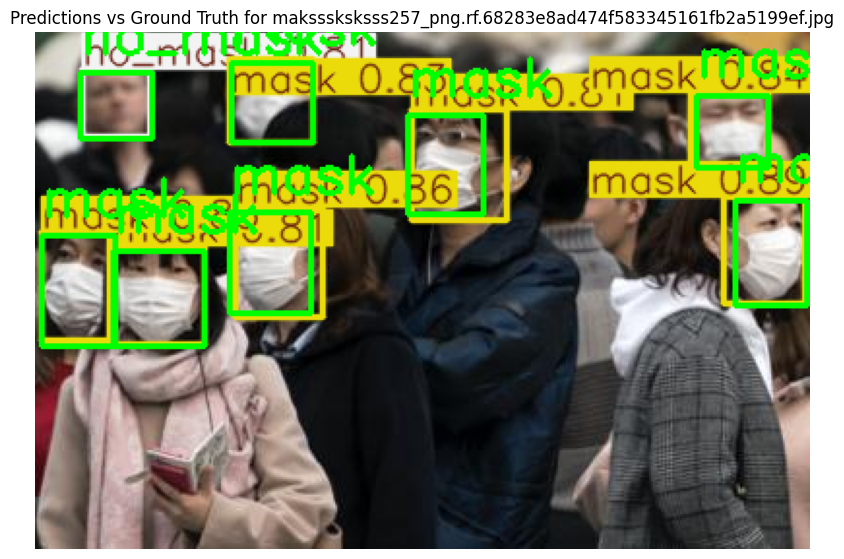

/kaggle/working/output/test/images/maksssksksss52_png.rf.b613a102e6ef12038cde9381ade314df.jpg

0: 384x640 10 masks, 7 no_masks, 11.4ms
Speed: 2.4ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


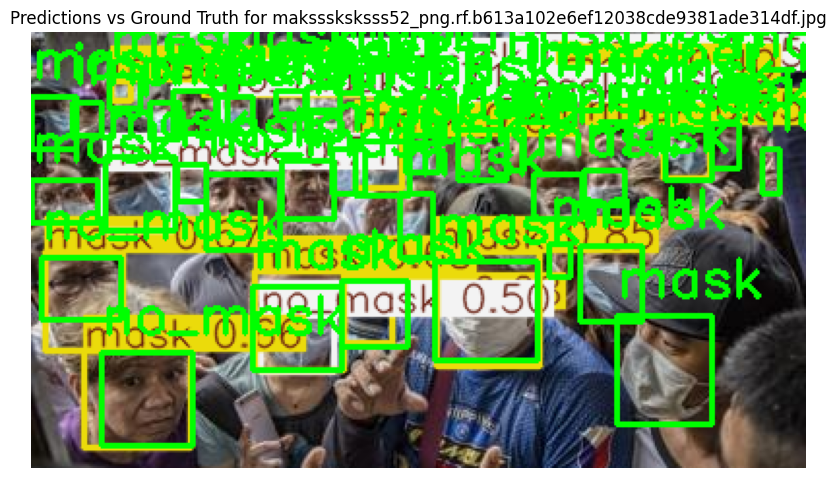

/kaggle/working/output/test/images/1_0_liuqianhan_0091_jpg.rf.f82f31a22475bfe2e9f81e18647e1fe6.jpg

0: 512x640 1 no_mask, 40.6ms
Speed: 2.0ms preprocess, 40.6ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


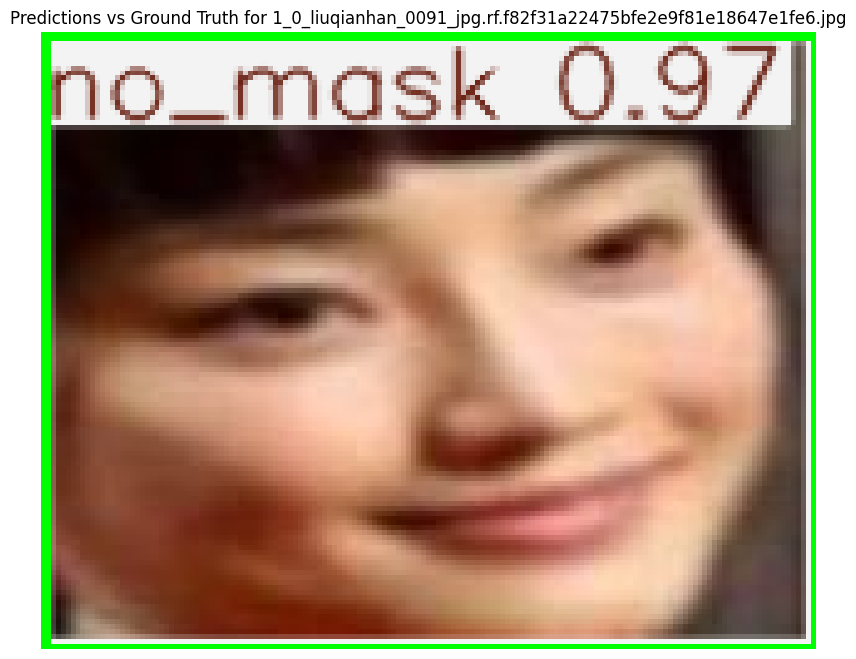

/kaggle/working/output/test/images/1_0_caiyilin_0088_jpg.rf.869a9f30af19dd7529bd28504516aa2d.jpg

0: 640x640 1 no_mask, 8.1ms
Speed: 2.6ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


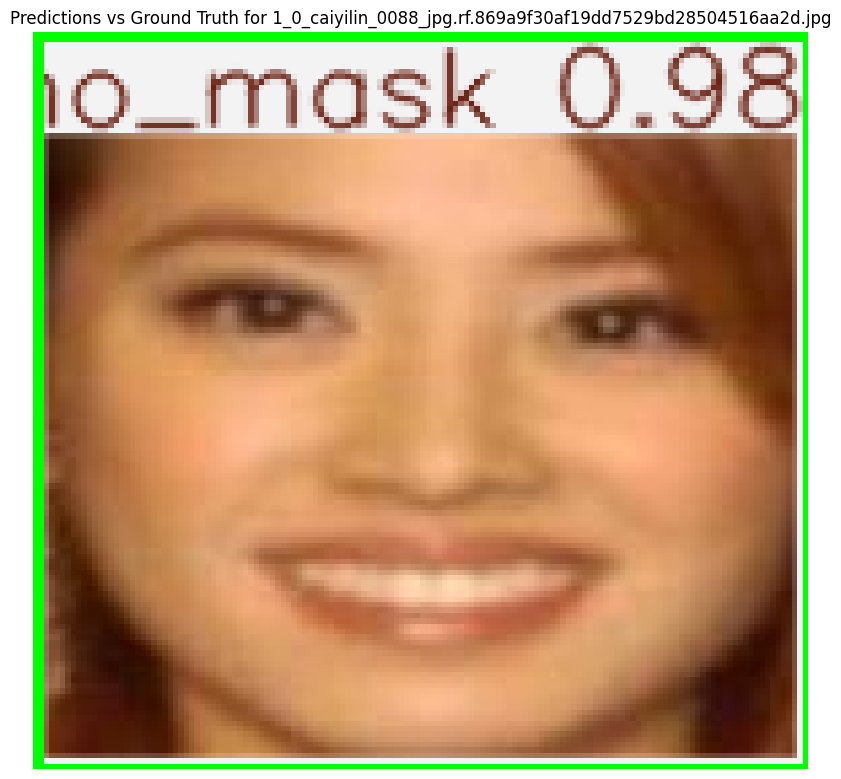

/kaggle/working/output/test/images/worng_mask797_jpg.rf.c320b7bc9b0da0e190fe7b557b1fd980.jpg

0: 384x640 1 improper_mask, 8.7ms
Speed: 1.8ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


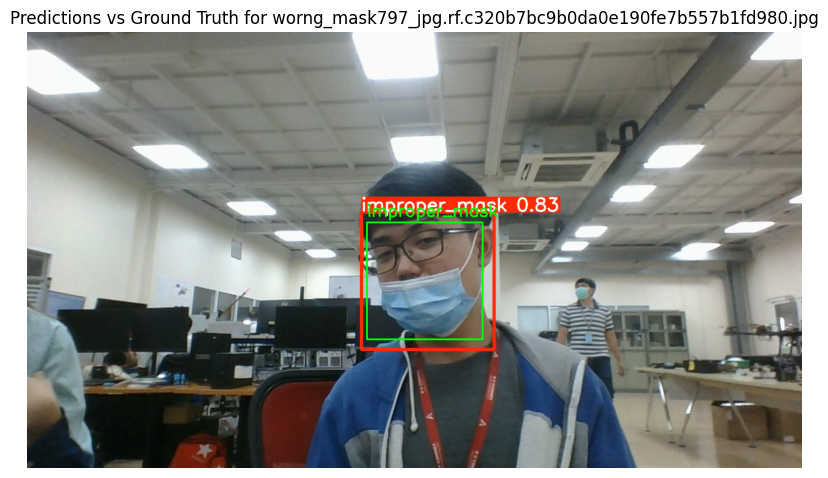

/kaggle/working/output/test/images/outside-19-_jpg.rf.c19b76c42b3489cefe43c16252d1b8ab.jpg

0: 640x640 1 improper_mask, 2 masks, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


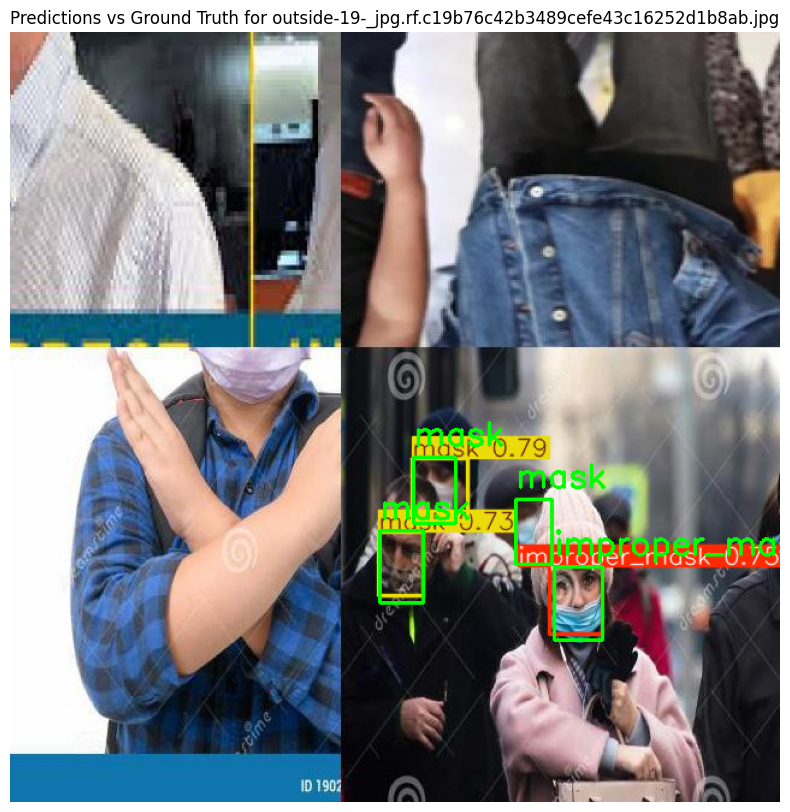

/kaggle/working/output/test/images/outside-76-_jpg.rf.adaf373e5db2456891a1dd096ca8d5b3.jpg

0: 640x640 2 improper_masks, 7.8ms
Speed: 1.7ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


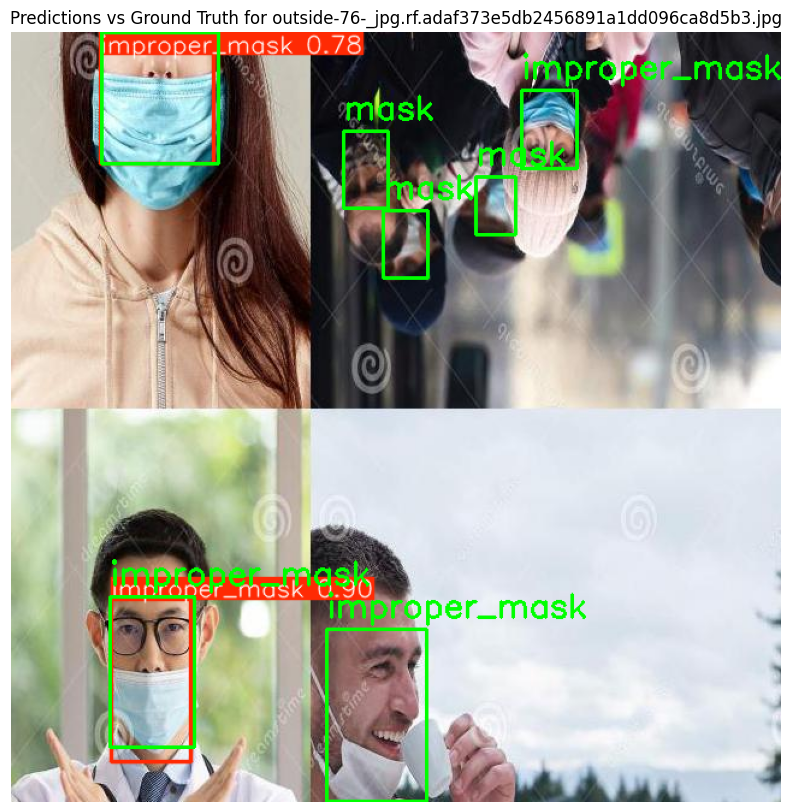

/kaggle/working/output/test/images/1_0_anhu_0021_jpg.rf.f296e40785fe20fd7c9df8f96778b045.jpg

0: 576x640 1 no_mask, 44.4ms
Speed: 2.1ms preprocess, 44.4ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 640)


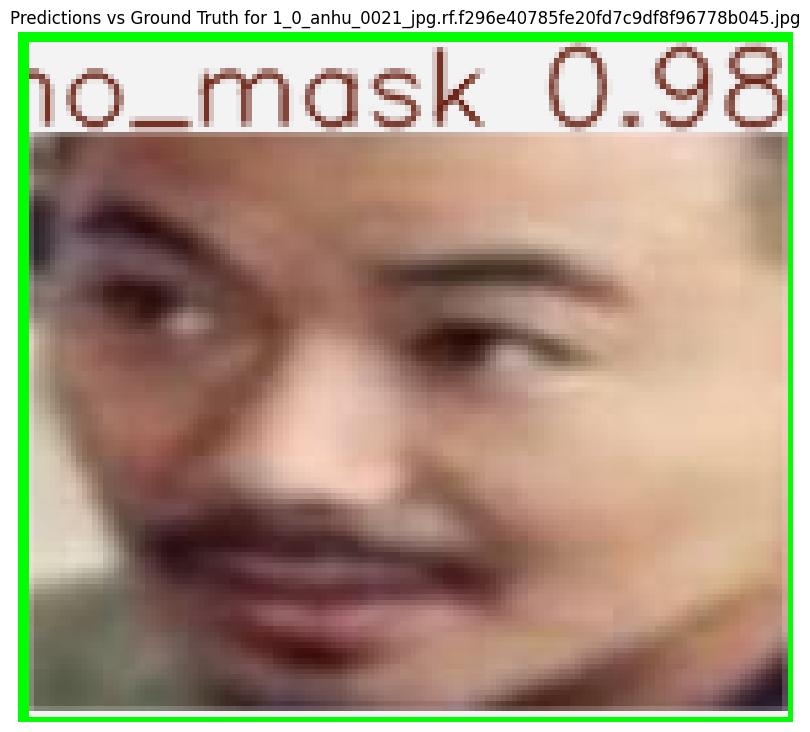

In [18]:

# Load trained YOLOv8 model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')  

# Define the path to the test dataset
test_images_path = '/kaggle/working/output/test/images/'  # Folder containing test images
test_labels_path = '/kaggle/working/output/test/labels/'  # Folder containing ground truth labels

# Get a list of test images
test_images = os.listdir(test_images_path)

# Visualize a few test images with predictions and ground truth
for img_name in test_images[15:25]:  # Show first 5 images for example
    # Load the image
    img_path = os.path.join(test_images_path, img_name)
    print(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Run model prediction
    results = model(img)

    # Draw predicted bounding boxes on the image
    img_with_predictions = results[0].plot()

    # Load ground truth labels (YOLO format: class, x_center, y_center, width, height)
    label_path = os.path.join(test_labels_path, img_name.replace('.jpg', '.txt'))
    with open(label_path, 'r') as f:
        ground_truth_boxes = f.readlines()

    # Draw ground truth boxes on the image
    for box in ground_truth_boxes:
        cls, x_center, y_center, width, height = map(float, box.split())
        x_min = int((x_center - width / 2) * img.shape[1])
        y_min = int((y_center - height / 2) * img.shape[0])
        x_max = int((x_center + width / 2) * img.shape[1])
        y_max = int((y_center + height / 2) * img.shape[0])

        # Draw ground truth bounding box (in green)
        cv2.rectangle(img_with_predictions, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)

        # Add class label to the ground truth box (in green)
        class_name = model.names[int(cls)]
        cv2.putText(img_with_predictions, class_name, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Display the image with both predicted and ground truth boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(img_with_predictions)
    plt.axis('off')
    plt.title(f"Predictions vs Ground Truth for {img_name}")
    plt.show()


Save run folder

In [19]:
# Create zip folder of run
import shutil
shutil.make_archive('runs', 'zip', '/kaggle/working/runs')

'/kaggle/working/runs.zip'